# DVC Experiments Explorer

Interactive notebook for exploring DVC experiment metrics.

In [1]:
import dvc.api
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import ipywidgets as widgets
from IPython.display import display


In [2]:
import os

# Load experiments from the last num commits
experiments = dvc.api.exp_show(num=200)  # the branch carries many small commits; older experiments hang on commits far back
df = pd.DataFrame(experiments)
print(f"Loaded {len(df)} experiments, {len(df.columns)} columns")

# Normalize column names by removing directory paths
# e.g., "metrics_out/eval_kfac/bergson/7b/file.json:metric" -> "file.json:metric"
def normalize_col_name(col):
    if '/' in col:
        return os.path.basename(col.split(':')[0]) + (':' + col.split(':', 1)[1] if ':' in col else '')
    return col

# Group columns by normalized name and merge
normalized_cols = {}
for col in df.columns:
    norm_name = normalize_col_name(col)
    if norm_name not in normalized_cols:
        normalized_cols[norm_name] = []
    normalized_cols[norm_name].append(col)

# Create new dataframe with merged columns
new_df = pd.DataFrame()
for norm_name, orig_cols in normalized_cols.items():
    if len(orig_cols) == 1:
        new_df[norm_name] = df[orig_cols[0]]
    else:
        # Merge columns: combine non-null values
        merged = df[orig_cols[0]].copy()
        for other_col in orig_cols[1:]:
            merged = merged.combine_first(df[other_col])
        new_df[norm_name] = merged

df = new_df
print(f"After path normalization: {len(df.columns)} columns")

# Further normalize: if metric name is unique, drop the filename prefix
# e.g., "file.json:metric" -> "metric" (if no other file has "metric")
metric_to_cols = {}
for col in df.columns:
    if ':' in col:
        metric = col.split(':', 1)[1]
        if metric not in metric_to_cols:
            metric_to_cols[metric] = []
        metric_to_cols[metric].append(col)

# Rename columns where metric name is unique
rename_map = {}
for metric, cols in metric_to_cols.items():
    if len(cols) == 1 and metric not in df.columns:
        rename_map[cols[0]] = metric

df = df.rename(columns=rename_map)
print(f"After metric normalization: {len(df.columns)} columns (renamed {len(rename_map)})")

# Convert columns to numeric where possible (DVC uses "!" for errors which breaks dtype detection)
for col in df.columns:
    converted = pd.to_numeric(df[col], errors='coerce')
    # Only use converted column if it has at least some valid numeric values
    if converted.notna().any():
        df[col] = converted

print(f"Numeric columns: {len(df.select_dtypes(include=['number']).columns)}")

# Merge variant olmes columns (some experiments report under different filenames)
_olmes_merges = {
    ":olmes.json:winogrande::olmes": "rc::olmes.json:winogrande:rc::olmes",
    ":olmes.json:winogrande:mc::olmes": None,  # no variant
    ":olmes.json:winogrande:rc::olmes": "rc::olmes.json:winogrande:rc::olmes",
}
for target, variant in _olmes_merges.items():
    if variant and target in df.columns and variant in df.columns:
        df[target] = df[target].combine_first(df[variant])
        df.drop(columns=[variant], inplace=True)
        print(f"Merged {variant} into {target}")

Loaded 257 experiments, 310 columns
After path normalization: 166 columns
After metric normalization: 166 columns (renamed 25)
Numeric columns: 72
Merged rc::olmes.json:winogrande:rc::olmes into :olmes.json:winogrande::olmes


In [3]:
#print(df['collect_kfac.args.method'])
col = 'collect_kfac.args.method'
df[col] = df[col].replace("None", "kfac")
col = 'eval_kfac.use_wanda'
df[col] = df[col].replace("None", "False")
col = "collect_kfac.args.calibration_mix"
df[col] = df[col].replace("None", "first_n")

In [4]:
# Identify numeric columns suitable for plotting
numeric_cols = df.select_dtypes(include=['number']).columns.tolist()

# Filter to columns that have some variation (not all same value or all NaN)
useful_cols = [col for col in numeric_cols if df[col].nunique() > 1]

# Sort for easier navigation
useful_cols = sorted(useful_cols)

print(f"Found {len(useful_cols)} plottable columns")

Found 49 plottable columns


In [5]:
# Find sensible defaults
default_x = 'kfac_perplexity_bsn_post' if 'kfac_perplexity_bsn_post' in useful_cols else useful_cols[0]
default_y = 'kfac_mem_loose_acc' if 'kfac_mem_loose_acc' in useful_cols else useful_cols[1] if len(useful_cols) > 1 else useful_cols[0]

# Find columns suitable for grouping (boolean or categorical with few unique values)
group_cols = []
for col in df.columns:
    unique_vals = df[col].dropna().unique()
    if len(unique_vals) == 0:
        continue
    unique_set = set(unique_vals)
    # Boolean columns
    if unique_set <= {True, False, 'True', 'False', 1, 0, 1.0, 0.0}:
        group_cols.append(col)
    # Categorical-ish columns: type with more than one unique values
    elif 1 < len(unique_vals):
        group_cols.append(col)

group_cols = sorted(group_cols)
print(f"Found {len(group_cols)} columns for grouping (boolean + categorical)")

# Container for all plot widgets
plots_container = widgets.VBox()
plot_widgets = []

def create_plot_row(x_val=None, y_val=None):
    """Create a new plot row with dropdowns and output."""
    x_dropdown = widgets.Dropdown(
        options=useful_cols,
        value=x_val or default_x,
        description='X:',
        style={'description_width': '30px'},
        layout=widgets.Layout(width='250px')
    )
    y_dropdown = widgets.Dropdown(
        options=useful_cols,
        value=y_val or default_y,
        description='Y:',
        style={'description_width': '30px'},
        layout=widgets.Layout(width='250px')
    )
    # Multi-select for grouping columns
    color_select = widgets.SelectMultiple(
        options=group_cols,
        value=[],
        description='Group by:',
        style={'description_width': '60px'},
        layout=widgets.Layout(width='300px', height='80px')
    )
    remove_btn = widgets.Button(description='Remove', button_style='danger', layout=widgets.Layout(width='80px'))
    output = widgets.Output()
    
    row_data = {'x': x_dropdown, 'y': y_dropdown, 'color': color_select, 'output': output, 'remove': remove_btn}
    
    def update_this_plot(*args):
        output.clear_output(wait=True)
        with output:
            x_col = x_dropdown.value
            y_col = y_dropdown.value
            color_cols = list(color_select.value)
            
            cols_needed = [x_col, y_col] + color_cols + ['Experiment', 'rev']
            plot_df = df[[c for c in cols_needed if c in df.columns]].dropna(subset=[x_col, y_col]).copy()
            
            plot_df['label'] = plot_df.apply(
                lambda row: row['Experiment'] if pd.notna(row.get('Experiment')) else str(row.get('rev', 'unknown'))[:8],
                axis=1
            )
            
            # Create category column from selected columns
            color_col = None
            category_orders = {}
            if color_cols:
                def make_category(row):
                    parts = []
                    for c in color_cols:
                        val = row.get(c)
                        col_name = c.split('.')[-1]
                        if pd.isna(val):
                            parts.append(f"{col_name}=?")
                        elif val in (True, 'True', 1, 1.0):
                            parts.append(f"{col_name}=T")
                        elif val in (False, 'False', 0, 0.0):
                            parts.append(f"{col_name}=F")
                        else:
                            # Categorical value - use as-is
                            parts.append(f"{col_name}={val}")
                    return ', '.join(parts)
                plot_df['_category'] = plot_df.apply(make_category, axis=1)
                color_col = '_category'
                # Sort categories for deterministic color mapping
                category_orders = {'_category': sorted(plot_df['_category'].unique())}
            
            fig = px.scatter(
                plot_df, x=x_col, y=y_col, color=color_col,
                color_discrete_sequence=px.colors.qualitative.D3,
                hover_data=['label'],
                title=f"{y_col} vs {x_col} ({len(plot_df)} points)",
                category_orders=category_orders
            )
            fig.update_layout(height=450)
            fig.show()
    
    def remove_this_plot(btn):
        if row_data in plot_widgets:
            plot_widgets.remove(row_data)
            refresh_plots_container()
    
    x_dropdown.observe(update_this_plot, names='value')
    y_dropdown.observe(update_this_plot, names='value')
    color_select.observe(update_this_plot, names='value')
    remove_btn.on_click(remove_this_plot)
    
    plot_widgets.append(row_data)
    update_this_plot()
    return row_data

def refresh_plots_container():
    """Rebuild the plots container from current plot_widgets."""
    rows = []
    for pw in plot_widgets:
        controls = widgets.HBox([pw['x'], pw['y'], pw['color'], pw['remove']])
        rows.append(widgets.VBox([controls, pw['output']], layout=widgets.Layout(border='1px solid #ccc', padding='5px', margin='5px 0')))
    plots_container.children = rows

def add_plot_clicked(btn):
    create_plot_row()
    refresh_plots_container()

add_btn = widgets.Button(description='+ Add Plot', button_style='success', layout=widgets.Layout(width='100px'))
add_btn.on_click(add_plot_clicked)

# Create initial plot
create_plot_row()
refresh_plots_container()

# Display
display(widgets.VBox([add_btn, plots_container]))

Found 117 columns for grouping (boolean + categorical)


In [6]:
# Matplotlib-based scatter helper with filtering / display-renaming /
# per-column marker shapes. Drop-in replacement for the previous plotly
# quick_plot — same first three positional args still work.
from itertools import cycle as _cycle


_DEFAULT_MARKERS = ("o", "s", "^", "D", "v", "P", "*", "X", "p", "h", "<", ">")


def _qp_place_labels(ax, pts, labels, fontsize=7):
    """Annotate points, de-overlapping labels via adjustText.

    adjustText is not a project dependency; launch jupyter with an extra
    `--with adjustText` to enable it. Without it, falls back to the old
    fixed-offset labels (which may overlap).
    """
    if not labels:
        return
    try:
        from adjustText import adjust_text
    except ImportError:
        print("hint: add `--with adjustText` to your jupyter command for non-overlapping labels")
        for (px, py), t in zip(pts, labels):
            ax.annotate(str(t), (px, py), fontsize=fontsize, alpha=0.7,
                        xytext=(3, 3), textcoords="offset points")
        return
    ax.figure.canvas.draw()  # ensure a renderer exists (ipympl/widget backends)
    xs = [p[0] for p in pts]
    ys = [p[1] for p in pts]
    texts = [
        ax.text(px, py, str(t), fontsize=fontsize, alpha=0.85)
        for (px, py), t in zip(pts, labels)
    ]
    adjust_text(
        texts, x=xs, y=ys, ax=ax,
        expand=(1.4, 2.0), force_text=(0.4, 0.8), force_explode=(0.15, 0.4),
        expand_axes=True, time_lim=5,
        arrowprops=dict(arrowstyle="-", color="gray", lw=0.5, alpha=0.6),
    )


def _qp_is_na(v):
    try:
        return pd.isna(v)
    except (TypeError, ValueError):
        return False


def _qp_fmt_val(v):
    if _qp_is_na(v):
        return "NA"
    if v is True or v == 1 or v == 1.0:
        return "T"
    if v is False or v == 0 or v == 0.0:
        return "F"
    return str(v)


def _qp_eq(series, spec):
    """Equality filter that also handles DVC's string booleans."""
    if isinstance(spec, bool):
        return series.isin([spec, str(spec)])
    return series == spec


def _qp_label(disp_name, value):
    """Legend label: ``"name=value"`` if ``disp_name`` is truthy, else just ``value``."""
    v = _qp_fmt_val(value)
    #return f"{disp_name}={v}" if disp_name else v
    if v == "ekfac":
        return "EK-FAC"
    if v == "efoof":
        return "E-FOOF"
    if v == "identity":
        return "Identity"
    if v == "eshampoo":
        return "E-Shampoo"
    if v == "eidentity":
        return "E-Identity"
    if v == "foof":
        return "FOOF"
    if v == "kfac":
        return "K-FAC"
    if v == "shampoo":
        return "Shampoo"
    if v == "mkfac":
        return "MK-FAC"
    if v == "mfoof":
        return "M-FOOF"
    if v == "midentity":
        return "M-Identity"
    if v == "mshampoo":
        return "M-Shampoo"
    if v == "marginal":
        return "marginal-only corrections"
    if v == "marginal-G":
        return "G-side (output-direction) marginal only"
    if v == "marginal-A":
        return "A-side (input-direction) marginal only"
    if v == "sfoof":
        return "FOOF + Shampoo corr."
    if v == "skfac":
        return "K-FAC + Shampoo corr."
    if v == "sidentity":
        return "Identity + Shampoo corr."
    if v == "ckfac":
        return "K-FAC + per-token corr."
    if v == "cfoof":
        return "FOOF + per-token corr."
    if v == "cidentity":
        return "Identity + per-token corr."
    if v == "iidentity":
        return "Identity, two-step"
    if v == "shampoo-corr-dolmino":
        return "dolmino mix, corrections from Shampoo covariances (no correction pass)"
    if v == "shampoo-corr-gsm8k":
        return "gsm8k train set, corrections from Shampoo covariances (no correction pass)"
    if v == "shampoo-corr-cross":
        return "basis and Shampoo corrections from different calibration mixes"
    if v == "noise":
        return "Noise in layers 23-25 (no pruning)"
    if v == "private-noise":
        return "Gaussian noise confined to the private block"
    if v == "public-noise":
        return "Gaussian noise confined to the public block"
    if v == "coupled-corr":
        return "corrections from norm-weighted per-token covariances (5% data, no correction pass)"
    if v == "two-step-reest":
        return "two-step edit from E-Identity 0.75, re-estimated marginals"
    if v == "two-step-base":
        return "two-step edit from E-Identity 0.75, base-model marginals (control)"
    if isinstance(v, str) and " (1/" in v:
        base, frac = v.split(" (1/", 1)
        return f"{_qp_label(disp_name, base)} (1/{frac}"
    if v in ("foof-dolmino", "kfac-dolmino", "shampoo-dolmino"):
        return "dolmino mix"
    if v in ("foof-gsm8k", "kfac-gsm8k", "shampoo-gsm8k"):
        return "gsm8k train set"
    return v


def quick_plot(
    x,
    y,
    color=None,
    marker=None,
    *,
    filters=None,
    rename=None,
    title=None,
    figsize=(9.0, 6.0),
    log_x=False,
    log_y=False,
    s=45,
    alpha=0.85,
    edgecolor="black",
    linewidth=0.4,
    annotate=False,
    legend=True,
    legend_loc="best",
    color_map=None,
    marker_map=None,
    ax=None,
    df=None,
):
    """Scatter plot ``y`` vs ``x`` with rich styling.

    Parameters
    ----------
    x, y : str
        Column names for the X / Y axes.
    color : str or callable or None
        Column name (categorical colour by that column's values) or
        ``f(row) -> category``. Categories not present in ``color_map``
        cycle through ``tab10``.
    marker : str or callable or None
        Same as ``color`` but for the point shape. Categories not present
        in ``marker_map`` cycle through ``_DEFAULT_MARKERS``.
    filters : dict or callable or None
        Filter the DataFrame before plotting:

        * ``{col: value}``       — equality
        * ``{col: [v1, v2]}``    — ``isin``
        * ``{col: f(series)}``   — boolean mask from the column
        * ``f(df) -> bool series`` — arbitrary mask

        Multiple dict entries are AND-ed together.
    rename : dict
        ``{column_name: display_name}`` used for axis labels, legend
        prefixes and the auto-generated title.
    title : str
        Defaults to ``"<y_display> vs <x_display> (N points)"``.
    log_x, log_y : bool
    s, alpha, edgecolor, linewidth :
        Forwarded to ``ax.scatter`` for every group.
    annotate : bool | str | callable
        ``True`` → annotate each point with ``Experiment`` (or first 8
        chars of ``rev`` if ``Experiment`` is missing). A column name
        uses that column. A callable receives each row.
    legend, legend_loc : legend control.
    color_map, marker_map : dict
        Optional explicit ``{category_value: color/marker}`` overrides.
    ax : matplotlib Axes (optional). When ``None`` a new figure is made.
    df : DataFrame (optional). Defaults to the notebook's module-level
        ``df``.

    Returns
    -------
    (fig, ax)
    """
    plot_df = (df if df is not None else globals()["df"]).copy()

    # 1) filters -----------------------------------------------------------
    if filters is not None:
        if callable(filters):
            mask = filters(plot_df)
        else:
            import numpy as _np
            mask = pd.Series(True, index=plot_df.index)
            for col, spec in filters.items():
                if callable(spec):
                    mask &= spec(plot_df[col])
                elif isinstance(spec, (list, set, tuple, pd.Index, _np.ndarray)):
                    mask &= plot_df[col].isin(list(spec))
                else:
                    mask &= _qp_eq(plot_df[col], spec)
        plot_df = plot_df[mask.fillna(False)]

    plot_df = plot_df.dropna(subset=[x, y])
    if plot_df.empty:
        raise ValueError(
            f"No rows remain to plot ({x} vs {y}) after filtering / NA-drop."
        )

    rename = dict(rename or {})
    color_map = dict(color_map or {})
    marker_map = dict(marker_map or {})

    def _disp(col):
        return rename.get(col, col)

    # 2) resolve color / marker categories --------------------------------
    def _resolve(spec, fallback_label):
        if spec is None:
            return None, None
        if callable(spec):
            return plot_df.apply(spec, axis=1), fallback_label
        return plot_df[spec], spec

    color_cat, color_name = _resolve(color, "color")
    marker_cat, marker_name = _resolve(marker, "marker")

    def _assign(values, override, defaults):
        cy = _cycle(defaults)
        out = {}
        for v in sorted({val for val in values if not _qp_is_na(val)}, key=str):
            out[v] = override[v] if v in override else next(cy)
        return out

    palette = list(plt.get_cmap("tab10").colors)
    color_for = (
        _assign(color_cat.tolist(), color_map, palette) if color_cat is not None else None
    )
    marker_for = (
        _assign(marker_cat.tolist(), marker_map, _DEFAULT_MARKERS)
        if marker_cat is not None
        else None
    )

    # 3) plot --------------------------------------------------------------
    if ax is None:
        fig, ax = plt.subplots(figsize=figsize)
    else:
        fig = ax.figure

    if color_cat is None and marker_cat is None:
        ax.scatter(
            plot_df[x], plot_df[y],
            s=s, alpha=alpha, edgecolor=edgecolor, linewidth=linewidth,
        )
    else:
        keys = []
        if color_cat is not None:
            keys.append(color_cat.rename("__color__"))
        if marker_cat is not None:
            keys.append(marker_cat.rename("__marker__"))
        grouped = plot_df.groupby(keys, dropna=False, sort=False)
        for key, group in grouped:
            if not isinstance(key, tuple):
                key = (key,)
            ki = 0
            kw = dict(s=s, alpha=alpha, edgecolor=edgecolor, linewidth=linewidth)
            label_parts = []
            if color_cat is not None:
                cv = key[ki]; ki += 1
                kw["color"] = color_for.get(cv, "lightgray")
                label_parts.append(_qp_label(_disp(color_name), cv))
            if marker_cat is not None:
                mv = key[ki]; ki += 1
                kw["marker"] = marker_for.get(mv, "o")
                label_parts.append(_qp_label(_disp(marker_name), mv))
            # Dedupe identical entries (e.g. when color and marker
            # categorise the same way for some group).
            seen = []
            for _p in label_parts:
                if _p not in seen:
                    seen.append(_p)
            kw["label"] = ", ".join(seen)
            ax.scatter(group[x], group[y], **kw)

    # 4) annotations -------------------------------------------------------
    if annotate:
        if annotate is True:
            def _label_fn(row):
                exp = row.get("Experiment")
                if pd.notna(exp):
                    return exp
                rev = row.get("rev")
                return str(rev)[:8] if pd.notna(rev) else None
        elif isinstance(annotate, str):
            def _label_fn(row, _col=annotate):
                v = row.get(_col)
                return v if pd.notna(v) else None
        else:
            _label_fn = annotate
        _pts, _lbls = [], []
        for _, row in plot_df.iterrows():
            txt = _label_fn(row)
            if txt is None or (isinstance(txt, float) and pd.isna(txt)):
                continue
            _pts.append((row[x], row[y]))
            _lbls.append(str(txt))
    else:
        _pts, _lbls = [], []

    if log_x:
        ax.set_xscale("log")
    if log_y:
        ax.set_yscale("log")

    ax.set_xlabel(_disp(x))
    ax.set_ylabel(_disp(y))
    ax.set_title(title or f"{_disp(y)} vs {_disp(x)} ({len(plot_df)} points)")
    ax.grid(True, alpha=0.3)

    if legend and (color_cat is not None or marker_cat is not None):
        ax.legend(fontsize=8, loc=legend_loc, framealpha=0.9)

    fig.tight_layout()
    # place labels only after the final geometry is known
    _qp_place_labels(ax, _pts, _lbls, fontsize=7)
    return fig, ax


def multi_plot(
    x,
    ys,
    color=None,
    marker=None,
    *,
    filters=None,
    rename=None,
    title=None,
    panel_titles=None,
    figsize=None,
    log_x=False,
    log_y=False,
    s=45,
    alpha=0.85,
    edgecolor="black",
    linewidth=0.4,
    annotate=False,
    legend=True,
    legend_loc="best",
    color_map=None,
    marker_map=None,
    sharey=False,
    df=None,
):
    """Side-by-side scatter panels sharing X axis, data, and legend.

    Parameters
    ----------
    x : str
        Column for the shared X axis.
    ys : list[str]
        Column for the Y axis of each panel (one subplot per entry).
    color, marker, filters, rename, color_map, marker_map, annotate,
    s, alpha, edgecolor, linewidth, log_x, log_y, legend, legend_loc :
        Same semantics as ``quick_plot``.
    title : str
        Suptitle for the whole figure.
    panel_titles : list[str] or dict[str, str], optional
        Per-panel titles, separate from the y-axis label.

        * ``None`` (default) — title falls back to ``rename.get(y_col, y_col)``.
        * ``list[str]`` — one entry per ``ys``; must match length.
        * ``dict[str, str]`` — keyed by y column name; missing keys fall
          back to the display name.
    figsize : (w, h)
        Defaults to ``(5 * len(ys), 5)``.
    sharey : bool
        If True all panels share the same Y limits.
    df : DataFrame
        Defaults to notebook-level ``df``.

    Returns
    -------
    (fig, axes)
    """
    import numpy as _np

    plot_df = (df if df is not None else globals()["df"]).copy()

    # 1) filter
    if filters is not None:
        if callable(filters):
            mask = filters(plot_df)
        else:
            mask = pd.Series(True, index=plot_df.index)
            for col, spec in filters.items():
                if callable(spec):
                    mask &= spec(plot_df[col])
                elif isinstance(spec, (list, set, tuple, pd.Index, _np.ndarray)):
                    mask &= plot_df[col].isin(list(spec))
                else:
                    mask &= _qp_eq(plot_df[col], spec)
            mask = mask.fillna(False)
        plot_df = plot_df[mask]

    plot_df = plot_df.dropna(subset=[x])
    if plot_df.empty:
        raise ValueError("No rows remain after filtering / NA-drop.")

    rename = dict(rename or {})
    color_map = dict(color_map or {})
    marker_map = dict(marker_map or {})

    def _disp(col):
        return rename.get(col, col)

    # 2) resolve colour / marker categories
    def _resolve(spec, fallback_label):
        if spec is None:
            return None, None
        if callable(spec):
            return plot_df.apply(spec, axis=1), fallback_label
        return plot_df[spec], spec

    color_cat, color_name = _resolve(color, "color")
    marker_cat, marker_name = _resolve(marker, "marker")

    def _assign(values, override, defaults):
        cy = _cycle(defaults)
        out = {}
        for v in sorted({val for val in values if not _qp_is_na(val)}, key=str):
            out[v] = override[v] if v in override else next(cy)
        return out

    palette = list(plt.get_cmap("tab10").colors)
    color_for = (
        _assign(color_cat.tolist(), color_map, palette) if color_cat is not None else None
    )
    marker_for = (
        _assign(marker_cat.tolist(), marker_map, _DEFAULT_MARKERS)
        if marker_cat is not None
        else None
    )

    # 3) figure
    n_panels = len(ys)
    if figsize is None:
        figsize = (5 * n_panels, 5)
    # constrained layout reserves real canvas space for the outside legend and
    # suptitle — the old tight_layout + below-figure legend relied on the
    # inline backend's bbox_inches="tight" and overlaps under ipympl
    fig, axes = plt.subplots(
        1, n_panels, figsize=figsize, sharey=sharey, layout="constrained"
    )
    if n_panels == 1:
        axes = [axes]

    # Resolve annotation function once
    if annotate:
        if annotate is True:
            def _label_fn(row):
                exp = row.get("Experiment")
                if pd.notna(exp):
                    return exp
                rev = row.get("rev")
                return str(rev)[:8] if pd.notna(rev) else None
        elif isinstance(annotate, str):
            def _label_fn(row, _col=annotate):
                v = row.get(_col)
                return v if pd.notna(v) else None
        elif callable(annotate):
            _label_fn = annotate
        else:
            _label_fn = None
    else:
        _label_fn = None

    if panel_titles is None:
        def _panel_title(idx, y_col):
            return _disp(y_col)
    elif isinstance(panel_titles, dict):
        def _panel_title(idx, y_col):
            return panel_titles.get(y_col, _disp(y_col))
    elif isinstance(panel_titles, (list, tuple)):
        if len(panel_titles) != len(ys):
            raise ValueError(
                f"panel_titles has {len(panel_titles)} entries but "
                f"ys has {len(ys)}."
            )
        def _panel_title(idx, y_col):
            return panel_titles[idx]
    else:
        raise TypeError(
            f"panel_titles must be None, list, or dict; got {type(panel_titles).__name__}"
        )

    legend_handles = {}
    _pending_labels = []

    for panel_idx, (y_col, ax) in enumerate(zip(ys, axes)):
        panel_df = plot_df.dropna(subset=[y_col])
        if panel_df.empty:
            ax.set_title(f"{_panel_title(panel_idx, y_col)} (no data)")
            ax.set_xlabel(_disp(x))
            continue

        if color_cat is None and marker_cat is None:
            ax.scatter(
                panel_df[x], panel_df[y_col],
                s=s, alpha=alpha, edgecolor=edgecolor, linewidth=linewidth,
            )
        else:
            keys = []
            if color_cat is not None:
                keys.append(color_cat.reindex(panel_df.index).rename("__color__"))
            if marker_cat is not None:
                keys.append(marker_cat.reindex(panel_df.index).rename("__marker__"))
            grouped = panel_df.groupby(keys, dropna=False, sort=False)
            for key, group in grouped:
                if not isinstance(key, tuple):
                    key = (key,)
                ki = 0
                kw = dict(s=s, alpha=alpha, edgecolor=edgecolor, linewidth=linewidth)
                label_parts = []
                if color_cat is not None:
                    cv = key[ki]; ki += 1
                    kw["color"] = color_for.get(cv, "lightgray")
                    label_parts.append(_qp_label(_disp(color_name), cv))
                if marker_cat is not None:
                    mv = key[ki]; ki += 1
                    kw["marker"] = marker_for.get(mv, "o")
                    label_parts.append(_qp_label(_disp(marker_name), mv))
                seen = []
                for _p in label_parts:
                    if _p not in seen:
                        seen.append(_p)
                lbl = ", ".join(seen)
                kw["label"] = lbl
                h = ax.scatter(group[x], group[y_col], **kw)
                if lbl not in legend_handles:
                    legend_handles[lbl] = h

        # annotations
        if _label_fn is not None:
            _pts, _lbls = [], []
            for _, row in panel_df.iterrows():
                txt = _label_fn(row)
                if txt is None or (isinstance(txt, float) and pd.isna(txt)):
                    continue
                _pts.append((row[x], row[y_col]))
                _lbls.append(str(txt))
            _pending_labels.append((ax, _pts, _lbls))

        if log_x:
            ax.set_xscale("log")
        if log_y:
            ax.set_yscale("log")

        ax.set_xlabel(_disp(x))
        ax.set_ylabel(_disp(y_col))
        ax.set_title(_panel_title(panel_idx, y_col))
        ax.grid(True, alpha=0.3)

    # 4) shared legend
    if legend and legend_handles:
        fig.legend(
            legend_handles.values(),
            legend_handles.keys(),
            loc="outside lower center",
            ncol=min(len(legend_handles), 5),
            fontsize=9,
            framealpha=0.9,
        )

    if title:
        fig.suptitle(title, fontsize=13)

    # place labels only after the final geometry is known
    for _ax, _pts, _lbls in _pending_labels:
        _qp_place_labels(_ax, _pts, _lbls, fontsize=8)
    return fig, axes


(<Figure size 900x600 with 1 Axes>,
 <Axes: title={'center': 'Memory Accuracy vs Perplexity'}, xlabel='kfac_perplexity_bsn_post', ylabel='kfac_mem_loose_acc'>)

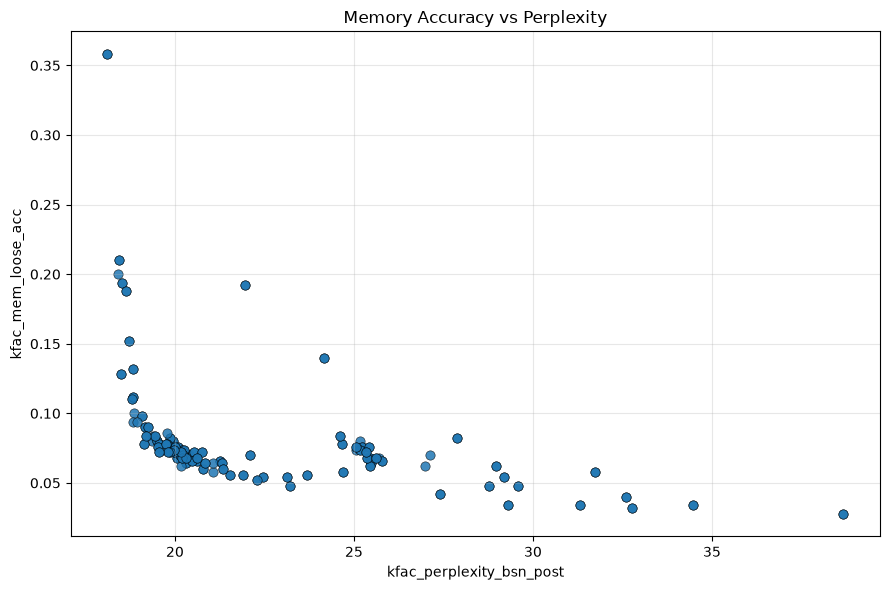

In [9]:
# Perplexity vs Memory Accuracy
quick_plot('kfac_perplexity_bsn_post', 'kfac_mem_loose_acc', title='Memory Accuracy vs Perplexity')

(<Figure size 1500x500 with 3 Axes>,
 array([<Axes: title={'center': 'Dolma Validation (↙ is better)'}, xlabel='Pile10k Perplexity (lower is better)', ylabel='Loose Accuracy (lower is better)'>,
        <Axes: title={'center': 'Historical Quotes (↙ is better)'}, xlabel='Pile10k Perplexity (lower is better)', ylabel='Strict Accuracy (lower is better)'>,
        <Axes: title={'center': 'GSM8K (↖ is better)'}, xlabel='Pile10k Perplexity (lower is better)', ylabel='Score (higher is better)'>],
       dtype=object))

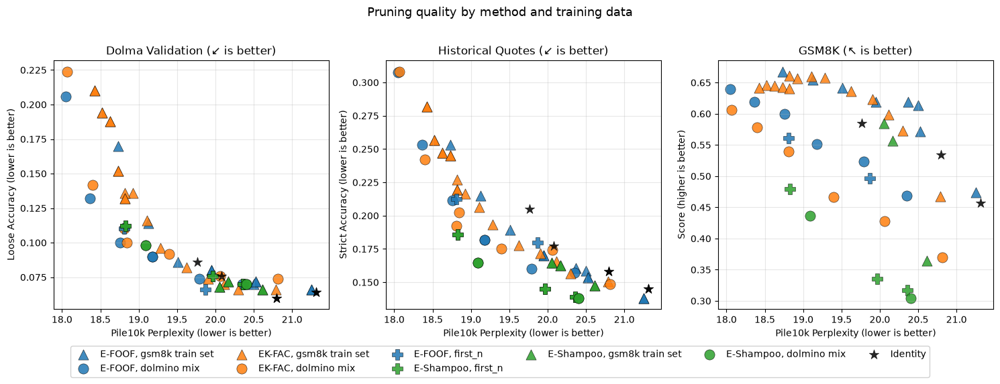

In [9]:
def _color_for_row(row):
    if row.get("method.name") == "identity":
        return "identity"
    method = row.get("collect_kfac.args.method", "?")
    ec = row.get("eval_kfac.use_eigenvalue_corrections") in (True, "True")
    if row.get("eval_kfac.use_marginal_corrections") in (True, "True"):
        return "m" + method  # marginal-only (separable) corrections
    start = str(row.get("eval_kfac.start_from_model", ""))
    if "noise" in start:
        return "noise"  # perturbed model evaluated as is (rho = 1, no edit)
    if _has_aux_corrections(row):
        src = str(row.get("eval_kfac.corrections_from"))
        if "synth_iter" in src:
            return "i" + method  # two-step edit (iterative), synthetic marginals
        if "synth_coupled" in src:
            return "c" + method  # corrections from norm-weighted per-token covariances
        return "s" + method  # corrections synthesised from a Shampoo collection
    return ("e" if ec else "") + method


def _aux_corrections_mask(d):
    """Boolean Series: rows whose eval used eval_kfac.corrections_from."""
    if "eval_kfac.corrections_from" not in d.columns:
        return pd.Series(False, index=d.index)
    return d["eval_kfac.corrections_from"].map(
        lambda v: isinstance(v, str) and v not in ("", "None", "nan", "-")
    )


def _has_aux_corrections(row):
    # exp_show renders a missing param as the string "None" (older runs) or ""
    v = row.get("eval_kfac.corrections_from")
    return isinstance(v, str) and v not in ("", "None", "nan", "-")


def _data_fraction_suffix(row):
    """" (1/k data)" when the collection used fewer bytes than the default 100MB."""
    try:
        nbytes = float(row.get("collect_kfac.args.nbytes"))
    except (TypeError, ValueError):
        return ""
    if not nbytes or nbytes >= 0.95 * 100_000_000:
        return ""
    return f" (1/{round(100_000_000 / nbytes)} data)"


_CALIB_MIX_PRETTY = {
    #"first_n": "dolmino in-order",
    "dolmino_50B": "dolmino mix",
    "gsm8k": "gsm8k train set",
}


def _marker_for_row(row):
    if row.get("method.name") == "identity":
        return "identity"  # fixed marker; calibration_mix irrelevant
    if row.get("eval_kfac.use_marginal_corrections") in (True, "True"):
        side = str(row.get("eval_kfac.corrections_side", ""))
        if side in ("G", "A"):
            return "marginal-" + side
        return "marginal" + _data_fraction_suffix(row)  # one marker for all marginal-only runs
    start0 = str(row.get("eval_kfac.start_from_model", ""))
    if "privnoise" in start0:
        return "private-noise"
    if "pubnoise" in start0:
        return "public-noise"
    if _has_aux_corrections(row):
        src = str(row.get("eval_kfac.corrections_from"))
        start = str(row.get("eval_kfac.start_from_model", ""))
        if start not in ("", "None", "nan", "-"):
            return "two-step-reest" if "eid075" in src else "two-step-base"
        if "synth_coupled" in src:
            return "coupled-corr"
        # marker carries the basis's calibration mix; a basis/corrections
        # pair from different mixes gets its own marker
        bmix = {"dolmino_50B": "dolmino"}.get(row.get("collect_kfac.args.calibration_mix"),
                                              row.get("collect_kfac.args.calibration_mix"))
        cmix = "gsm8k" if "gsm8k" in str(row.get("eval_kfac.corrections_from")) else "dolmino"
        return "shampoo-corr-" + (bmix if bmix == cmix else "cross")
    if (row.get("collect_kfac.args.method") in ("foof", "kfac", "shampoo")
            and row.get("eval_kfac.use_eigenvalue_corrections") not in (True, "True")):
        # plain (non-corrected) methods: star-family markers per calibration mix
        return row.get("collect_kfac.args.method") + "-" + {"dolmino_50B": "dolmino"}.get(
            row.get("collect_kfac.args.calibration_mix"),
            row.get("collect_kfac.args.calibration_mix"),
        )
    cm = row.get("collect_kfac.args.calibration_mix", "?")
    return _CALIB_MIX_PRETTY.get(cm, cm) + _data_fraction_suffix(row)


# Only show experiments from the corrected-pipeline era (Aug 2026 onward).
# Earlier points are unreliable for two distinct reasons:
#  1. transformers 5.6.0-5.12.x mis-tokenized OLMo-2 (GPT2Tokenizer discarded
#     tokenizer.json's pre-tokenizer; fixed upstream in 5.13.0 by PR #46091,
#     pinned here in commit fd05b20), poisoning the pile10k pt-cache and
#     factor collection of every experiment evaluated in that window.
#  2. Even good-tokenizer May-era edited models differ systematically from
#     identical configs rerun in the current environment (e.g. bergson/gsm8k
#     mass 0.86: GSM8K 0.641 -> 0.660, mem 0.132 -> 0.166), so mixing eras
#     puts spurious kinks in the pareto frontier. Verified by re-benchmarking
#     the same model under both olmes envs (bit-identical scores) and by
#     benchmarking the unpruned baseline (0.675, above both bands).
# Every config of interest has been (or is being) rerun post-cutoff.
NEW_ERA_CUTOFF = "2026-08-02"


PLOT_FILTER = lambda d: (
    (d["kfac_perplexity_bsn_post"] <= 21.5)
    & (d["kfac_mem_loose_acc"] <= 0.3)
    & _qp_eq(d["eval_kfac.use_weight_coefficients"], True)
    & _qp_eq(d["eval_kfac.use_wanda"], False)
    & (d["collect_kfac.args.method"] != "tkfac")
    # exp_show's Created is human-formatted ("May 07, 2026", or "06:37 PM"
    # for today) — parse it; time-only strings resolve to today's date.
    # Identity is exempt from the era cutoff: it uses no K-FAC factors and
    # reruns reproduce old-era values bit-for-bit (verified at mass 0.3 and
    # 0.6), so the old identity anchors remain valid.
    & ((pd.to_datetime(d["Created"], format="mixed", errors="coerce")
        >= pd.Timestamp(NEW_ERA_CUTOFF))
       | _qp_eq(d["method.name"], "identity"))
    & (
        _qp_eq(d["method.name"], "identity")
        | (
            # ec=True everywhere, except plain (non-corrected) FOOF/K-FAC which
            # we show to separate eigenbasis vs correction contributions
            (_qp_eq(d["eval_kfac.use_eigenvalue_corrections"], True)
             | d["collect_kfac.args.method"].isin(["foof", "kfac", "shampoo"])
             # corrections synthesised from a Shampoo collection (any basis)
             | _aux_corrections_mask(d))
            & d["collect_kfac.args.calibration_mix"].isin(["dolmino_50B", "gsm8k", "first_n"])
        )
    )
)

# shared by the 2D panels below and the 3D pareto cell, so both plots use
# identical colors and symbols
PLOT_COLOR_MAP = {
    # pin every series so colors stay stable in the filtered variant plots
    # below (tab10-cycle assignment depends on which categories are present)
    "identity": "black",
    "eidentity": "black",
    "efoof": "tab:blue",
    "foof": "tab:blue",
    "ekfac": "tab:orange",
    "kfac": "tab:orange",
    "eshampoo": "tab:green",
    "shampoo": "tab:green",
    "mkfac": "tab:orange",
    "mfoof": "tab:blue",
    "midentity": "black",
    "mshampoo": "tab:green",
    "sfoof": "tab:blue",
    "skfac": "tab:orange",
    "sidentity": "black",
    "ckfac": "tab:orange",
    "cfoof": "tab:blue",
    "cidentity": "black",
    "iidentity": "black",
    "noise": "tab:purple",
}
PLOT_MARKER_MAP = {
    "dolmino mix": "o",
    "gsm8k train set": "^",
    "first_n": "P",
    "identity": "*",
    "foof-dolmino": "*",
    "foof-gsm8k": "X",
    "kfac-dolmino": "*",
    "kfac-gsm8k": "X",
    "shampoo-dolmino": "*",
    "shampoo-gsm8k": "X",
    "marginal": "D",
    "marginal-G": "$G$",
    "marginal-A": "$A$",
    "shampoo-corr-dolmino": "s",
    "shampoo-corr-gsm8k": "H",
    "shampoo-corr-cross": "p",
    "coupled-corr": "8",
    "private-noise": "*",
    "public-noise": "x",
    "two-step-reest": "d",
    "two-step-base": "|",
    # reduced calibration data (collect_kfac.args.nbytes < 100MB)
    "dolmino mix (1/10 data)": "v",
    "dolmino mix (1/50 data)": "<",
    "marginal (1/10 data)": "v",
    "marginal (1/50 data)": "<",
}

PLOT_YS = [
    "kfac_mem_loose_acc",
    "kfac_quotes_strict_acc",
    ":olmes.json:gsm8k::olmes",
    # ":olmes.json:winogrande::olmes"
]
PLOT_RENAME = {
    "kfac_perplexity_bsn_post": "Pile10k Perplexity (lower is better)",
    "kfac_mem_loose_acc": "Loose Accuracy (lower is better)",
    "kfac_quotes_strict_acc": "Strict Accuracy (lower is better)",
    ":olmes.json:gsm8k::olmes": "Score (higher is better)",
    ":olmes.json:winogrande::olmes": "Score (higher is better)",
    "color": "",
    "marker": "",
}
PLOT_PANEL_TITLES = {
    "kfac_mem_loose_acc": "Dolma Validation (↙ is better)",
    "kfac_quotes_strict_acc": "Historical Quotes (↙ is better)",
    ":olmes.json:gsm8k::olmes": "GSM8K (↖ is better)",
    ":olmes.json:winogrande::olmes": "WinoGrande",
}

multi_plot(
    "kfac_perplexity_bsn_post",
    PLOT_YS,
    color=_color_for_row,
    marker=_marker_for_row,
    filters=PLOT_FILTER,
    rename=PLOT_RENAME,
    color_map=PLOT_COLOR_MAP,
    marker_map=PLOT_MARKER_MAP,
    panel_titles=PLOT_PANEL_TITLES,
    #annotate=lambda row: (
        #f"{row.get('Experiment', '?')}\n"
        #f"{row.get('layers.24.up', '?')}"
    #),
    title="Pruning quality by method and training data",
    s=120,
)


In [ ]:
# Same plot, restricted to EK-FAC (eigenvalue-corrected K-FAC) across all
# calibration mixes.
multi_plot(
    "kfac_perplexity_bsn_post",
    PLOT_YS,
    color=_color_for_row,
    marker=_marker_for_row,
    filters=lambda d: (
        PLOT_FILTER(d)
        & _qp_eq(d["collect_kfac.args.method"], "kfac")
        & _qp_eq(d["eval_kfac.use_eigenvalue_corrections"], True)
    ),
    rename=PLOT_RENAME,
    color_map=PLOT_COLOR_MAP,
    marker_map=PLOT_MARKER_MAP,
    panel_titles=PLOT_PANEL_TITLES,
    title="Pruning quality — EK-FAC only",
    s=120,
)


In [ ]:
# Same plot, restricted to the dolmino_50B calibration mix across all
# methods. Identity uses no calibration data, so it is kept as the
# mix-independent baseline; drop the second clause to hide it.
multi_plot(
    "kfac_perplexity_bsn_post",
    PLOT_YS,
    color=_color_for_row,
    marker=_marker_for_row,
    filters=lambda d: (
        PLOT_FILTER(d)
        & (_qp_eq(d["collect_kfac.args.calibration_mix"], "dolmino_50B")
           | _qp_eq(d["method.name"], "identity"))
    ),
    rename=PLOT_RENAME,
    color_map=PLOT_COLOR_MAP,
    marker_map=PLOT_MARKER_MAP,
    panel_titles=PLOT_PANEL_TITLES,
    title="Pruning quality — dolmino mix only",
    s=120,
)


In [ ]:
# 3D Pareto frontier: perplexity x quotes accuracy x GSM8K score.
# Uses the exact colors and symbols of the 2D panels above (matplotlib 3D:
# plotly's Scatter3d only supports 8 fixed symbols, no triangle/star/plus).
# Good corner: low ppl, low quotes acc, high GSM8K. Dominated configurations
# are dropped entirely; only the pareto set is shown. Rotation is
# interactive under the ipympl backend, which this cell activates.
import numpy as np
from itertools import cycle as _cycle3

_D3X = "kfac_perplexity_bsn_post"   # lower is better
_D3Y = "kfac_quotes_strict_acc"     # lower is better
_D3Z = ":olmes.json:gsm8k::olmes"   # higher is better

d3 = df[PLOT_FILTER(df).fillna(False)].dropna(subset=[_D3X, _D3Y, _D3Z]).copy()
d3["_series"] = d3.apply(_color_for_row, axis=1)
d3["_mix"] = d3.apply(_marker_for_row, axis=1)

_pts = d3[[_D3X, _D3Y, _D3Z]].to_numpy(dtype=float)
_dom = np.zeros(len(_pts), dtype=bool)
for _i in range(len(_pts)):
    _beq = (_pts[:, 0] <= _pts[_i, 0]) & (_pts[:, 1] <= _pts[_i, 1]) & (_pts[:, 2] >= _pts[_i, 2])
    _str = (_pts[:, 0] < _pts[_i, 0]) | (_pts[:, 1] < _pts[_i, 1]) | (_pts[:, 2] > _pts[_i, 2])
    _dom[_i] = bool(np.any(_beq & _str))
d3["_pareto"] = ~_dom
print(f"{int(d3['_pareto'].sum())} pareto-optimal of {len(d3)} points")

# same color-assignment rule as multi_plot: sorted categories, map overrides
# win without consuming the tab10 cycle
_cy3 = _cycle3(plt.get_cmap("tab10").colors)
_color3 = {
    v: PLOT_COLOR_MAP[v] if v in PLOT_COLOR_MAP else next(_cy3)
    for v in sorted(d3["_series"].unique(), key=str)
}

# rotation/zoom need the ipympl widget backend (`--with ipympl` in the
# jupyter command); the default inline backend renders a static PNG. Guarded
# so the cell also runs outside jupyter.
_ip = globals().get("get_ipython", lambda: None)()
if _ip is not None:
    try:
        _ip.run_line_magic("matplotlib", "widget")
    except Exception as _e:
        print(f"hint: interactive 3D needs ipympl ({_e})")

fig3d = plt.figure(figsize=(10, 8))
ax3d = fig3d.add_subplot(projection="3d")
_art_meta = {}
for (_s, _m), _g in d3[d3["_pareto"]].groupby(["_series", "_mix"]):
    _name = ", ".join(dict.fromkeys([_qp_label("", _s), _qp_label("", _m)]))
    _sc = ax3d.scatter(
        _g[_D3X], _g[_D3Y], _g[_D3Z],
        s=85, alpha=0.95, label=_name, depthshade=False,
        color=_color3[_s], marker=PLOT_MARKER_MAP.get(_m, "o"),
        edgecolor="black", linewidth=0.6,
    )
    _art_meta[_sc] = (_name, _g[["Experiment", "model_method.gate_up_mass"]].to_numpy())
ax3d.set_xlabel("Pile10k ppl (lower better)")
ax3d.set_ylabel("Quotes strict acc (lower better)")
ax3d.set_zlabel("GSM8K (higher better)")
ax3d.set_title("3D Pareto set (low ppl, low quotes, high GSM8K; dominated points dropped)")
ax3d.view_init(elev=18, azim=-55)
ax3d.legend(fontsize=8, loc="center left", bbox_to_anchor=(1.05, 0.5))
fig3d.tight_layout()

# click a point to label it (right-click the label to dismiss); needs
# `--with mplcursors` in the jupyter command
try:
    import mplcursors

    _cur3d = mplcursors.cursor(list(_art_meta), hover=False)

    @_cur3d.connect("add")
    def _on_pick3d(sel):
        _nm, _rows = _art_meta[sel.artist]
        _exp, _mass = _rows[sel.index]
        sel.annotation.set_text(f"{_exp} (mass {_mass})\n{_nm}")
except ImportError:
    print("hint: add `--with mplcursors` to your jupyter command for click-to-inspect labels")

plt.show()


## Data Exploration

In [ ]:
# Show all available metrics columns
metric_cols = [c for c in df.columns if c.startswith('kfac_')]
print("Available kfac metrics:")
for col in sorted(metric_cols):
    non_null = df[col].notna().sum()
    print(f"  {col}: {non_null} values")

In [ ]:
# Show experiments with kfac metrics as a table
kfac_cols = ['Experiment', 'rev', 'Created'] + [c for c in df.columns if c.startswith('kfac_') and not c.startswith('kfac_perplexity_block') and not c.startswith('kfac_perplexity_pt')]
kfac_df = df[kfac_cols].dropna(subset=['kfac_mem_loose_acc'])
kfac_df

## Eigenvector & Eigenvalue Comparison

Compare K-FAC eigenvectors and eigenvalues between two experiments for ablation analysis.

In [60]:
import numpy as np
import torch
from safetensors import safe_open
from safetensors.torch import load as safetensors_load
from pathlib import Path
from scipy import stats
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import tempfile
import io


def load_bergson_sharded(path: Path) -> dict:
    """Load sharded safetensors from bergson format, concatenating shards."""
    shard_files = sorted(path.glob("shard_*.safetensors"))
    if not shard_files:
        raise FileNotFoundError(f"No shards found in {path}")

    if len(shard_files) == 1:
        with safe_open(shard_files[0], framework="pt", device="cpu") as f:
            return {key: f.get_tensor(key) for key in f.keys()}

    # Multiple shards - concatenate along dim=0 (rows)
    with safe_open(shard_files[0], framework="pt", device="cpu") as f:
        keys = list(f.keys())

    result = {}
    for key in keys:
        shards = []
        for shard_file in shard_files:
            with safe_open(shard_file, framework="pt", device="cpu") as f:
                shards.append(f.get_tensor(key))
        result[key] = torch.cat(shards, dim=0)
    return result


def normalize_bergson_keys(data: dict) -> dict:
    """Normalize bergson keys by removing checkpoint wrapper module names."""
    return {k.replace("._checkpoint_wrapped_module.", "."): v for k, v in data.items()}


# =============================================================================
# DVC Experiment Loading Functions
# =============================================================================

def load_safetensors_from_dvc(file_path: str, rev: str = None) -> dict:
    """Load a safetensors file from a DVC experiment.
    
    Args:
        file_path: Path to the safetensors file relative to repo root
        rev: DVC experiment name, git revision, or None for workspace
        
    Returns:
        Dict of tensors
    """
    with dvc.api.open(file_path, rev=rev, mode='rb') as f:
        data = f.read()
    return safetensors_load(data)


def load_pt_from_dvc(file_path: str, rev: str = None, verbose: bool = False):
    """Load a .pt file from a DVC experiment.
    
    Args:
        file_path: Path to the .pt file relative to repo root
        rev: DVC experiment name, git revision, or None for workspace
        verbose: Print progress messages
        
    Returns:
        Loaded tensor/object
    """
    if verbose:
        print(f"    Loading {file_path}...", end=" ", flush=True)
    with dvc.api.open(file_path, rev=rev, mode='rb') as f:
        data = f.read()
    result = torch.load(io.BytesIO(data), map_location="cpu")
    if verbose:
        print("done")
    return result


def load_sharded_from_dvc(base_path: str, rev: str = None, verbose: bool = False) -> dict:
    """Load sharded safetensors from a DVC experiment.
    
    Args:
        base_path: Path to the directory containing shard_*.safetensors
        rev: DVC experiment name, git revision, or None for workspace
        verbose: Print progress messages
        
    Returns:
        Dict of concatenated tensors
    """
    # Try to find shard files by loading shard_0 first
    shard_idx = 0
    shards_data = []
    
    while True:
        shard_path = f"{base_path}/shard_{shard_idx}.safetensors"
        try:
            if verbose:
                print(f"    Loading {shard_path}...", end=" ", flush=True)
            data = load_safetensors_from_dvc(shard_path, rev=rev)
            if verbose:
                print(f"done ({len(data)} keys)")
            shards_data.append(data)
            shard_idx += 1
        except Exception as e:
            if verbose and shard_idx == 0:
                print(f"failed: {e}")
            break
    
    if not shards_data:
        raise FileNotFoundError(f"No shards found at {base_path}")
    
    if len(shards_data) == 1:
        return shards_data[0]
    
    # Concatenate shards
    if verbose:
        print(f"    Concatenating {len(shards_data)} shards...", end=" ", flush=True)
    keys = list(shards_data[0].keys())
    result = {}
    for key in keys:
        result[key] = torch.cat([s[key] for s in shards_data], dim=0)
    if verbose:
        print("done")
    return result


def load_experiment_kfac_data_dvc(
    exp_name: str, 
    module_name: str,
    kfac_output_path: str = "out/collect_kfac/bergson/7b",
    verbose: bool = False
) -> dict:
    """Load K-FAC eigenvectors and covariances from a DVC experiment by name.
    
    Args:
        exp_name: DVC experiment name (e.g., 'valid-soke', 'least-ryas')
        module_name: Module name, e.g., 'layers.23.mlp.up_proj'
        kfac_output_path: Path to K-FAC output directory (default for 7b bergson)
        verbose: Print progress messages
        
    Returns:
        Dict with keys: 'evc_A', 'evc_G', 'eva_A', 'eva_G', 'cov_A', 'cov_G'
    """
    influence_path = f"{kfac_output_path}/influence_results"
    
    # Load eigenvectors
    if verbose:
        print(f"  Loading activation eigenvectors...")
    act_eigen = normalize_bergson_keys(
        load_sharded_from_dvc(f"{influence_path}/activation_eigen_sharded", rev=exp_name, verbose=verbose)
    )
    if verbose:
        print(f"  Loading gradient eigenvectors...")
    grad_eigen = normalize_bergson_keys(
        load_sharded_from_dvc(f"{influence_path}/gradient_eigen_sharded", rev=exp_name, verbose=verbose)
    )
    
    # Load covariances
    if verbose:
        print(f"  Loading activation covariances...")
    act_cov = normalize_bergson_keys(
        load_sharded_from_dvc(f"{influence_path}/activation_covariance_sharded", rev=exp_name, verbose=verbose)
    )
    if verbose:
        print(f"  Loading gradient covariances...")
    grad_cov = normalize_bergson_keys(
        load_sharded_from_dvc(f"{influence_path}/gradient_covariance_sharded", rev=exp_name, verbose=verbose)
    )
    
    # Load total_processed for normalization
    if verbose:
        print(f"  Loading total_processed...")
    total_processed = load_pt_from_dvc(
        f"{influence_path}/total_processed_covariances.pt", rev=exp_name, verbose=verbose
    ).item()
    
    if module_name not in act_eigen:
        available = list(act_eigen.keys())
        raise KeyError(f"Module '{module_name}' not found. Available: {available[:5]}...")
    
    if verbose:
        print(f"  Computing eigenvalues for {module_name}...")
    
    # Get eigenvectors
    evc_A = act_eigen[module_name].float()
    evc_G = grad_eigen[module_name].float()
    
    # Get and normalize covariances
    cov_A = act_cov[module_name].float() / total_processed
    cov_A = (cov_A + cov_A.T) / 2
    cov_G = grad_cov[module_name].float() / total_processed
    cov_G = (cov_G + cov_G.T) / 2
    
    # Compute eigenvalues: lambda_i = v_i^T @ C @ v_i
    eva_A = (evc_A.T @ cov_A @ evc_A).diagonal()
    eva_G = (evc_G.T @ cov_G @ evc_G).diagonal()
    
    # Sort in descending order
    idx_A = eva_A.argsort(descending=True)
    eva_A = eva_A[idx_A]
    evc_A = evc_A[:, idx_A]
    
    idx_G = eva_G.argsort(descending=True)
    eva_G = eva_G[idx_G]
    evc_G = evc_G[:, idx_G]
    
    if verbose:
        print(f"  Done loading {exp_name}")
    
    return {
        'evc_A': evc_A,
        'evc_G': evc_G,
        'eva_A': eva_A,
        'eva_G': eva_G,
        'cov_A': cov_A,
        'cov_G': cov_G,
    }


def list_available_modules_dvc(
    exp_name: str,
    kfac_output_path: str = "out/collect_kfac/bergson/7b"
) -> list:
    """List available modules in a DVC experiment."""
    influence_path = f"{kfac_output_path}/influence_results"
    act_eigen = normalize_bergson_keys(
        load_sharded_from_dvc(f"{influence_path}/activation_eigen_sharded", rev=exp_name)
    )
    return sorted(act_eigen.keys())


def compare_dvc_experiments(
    exp1: str, 
    exp2: str, 
    module_name: str,
    kfac_output_path: str = "out/collect_kfac/bergson/7b",
    label1: str = None,
    label2: str = None,
    verbose: bool = True
) -> dict:
    """Compare K-FAC data from two DVC experiments by name.
    
    Args:
        exp1, exp2: DVC experiment names (e.g., 'valid-soke', 'least-ryas')
        module_name: Module name to compare
        kfac_output_path: Path to K-FAC output directory
        label1, label2: Optional labels (defaults to experiment names)
        verbose: Print progress messages (default True)
    
    Returns:
        Dict with comparison results and loaded data
    """
    label1 = label1 or exp1
    label2 = label2 or exp2
    
    print(f"Loading {exp1}...")
    data1 = load_experiment_kfac_data_dvc(exp1, module_name, kfac_output_path, verbose=verbose)
    print(f"Loading {exp2}...")
    data2 = load_experiment_kfac_data_dvc(exp2, module_name, kfac_output_path, verbose=verbose)
    
    print("Computing comparisons...")
    # Compute cosine similarities
    cos_sim_A = compute_eigenvector_cosine_similarities(data1['evc_A'], data2['evc_A'])
    cos_sim_G = compute_eigenvector_cosine_similarities(data1['evc_G'], data2['evc_G'])
    
    # Compute eigenvalue correlations
    eva_corr_A = compute_eigenvalue_correlation(data1['eva_A'], data2['eva_A'])
    eva_corr_G = compute_eigenvalue_correlation(data1['eva_G'], data2['eva_G'])
    
    print("Done!")
    return {
        'data1': data1,
        'data2': data2,
        'label1': label1,
        'label2': label2,
        'module': module_name,
        'cos_sim_A': cos_sim_A,
        'cos_sim_G': cos_sim_G,
        'eva_corr_A': eva_corr_A,
        'eva_corr_G': eva_corr_G,
    }


# =============================================================================
# Local Path Loading Functions (original)
# =============================================================================

def load_experiment_kfac_data(experiment_path: str, module_name: str) -> dict:
    """Load K-FAC eigenvectors and covariances for a specific module from a local path.
    
    Args:
        experiment_path: Path to bergson output directory (containing influence_results/)
        module_name: Module name, e.g., 'layers.23.mlp.up_proj'
        
    Returns:
        Dict with keys: 'evc_A', 'evc_G', 'eva_A', 'eva_G', 'cov_A', 'cov_G'
    """
    influence_path = Path(experiment_path) / "influence_results"
    
    # Load eigenvectors
    act_eigen = normalize_bergson_keys(load_bergson_sharded(influence_path / "activation_eigen_sharded"))
    grad_eigen = normalize_bergson_keys(load_bergson_sharded(influence_path / "gradient_eigen_sharded"))
    
    # Load covariances
    act_cov = normalize_bergson_keys(load_bergson_sharded(influence_path / "activation_covariance_sharded"))
    grad_cov = normalize_bergson_keys(load_bergson_sharded(influence_path / "gradient_covariance_sharded"))
    
    # Load total_processed for normalization
    total_processed_path = influence_path / "total_processed_covariances.pt"
    total_processed = torch.load(total_processed_path, map_location="cpu").item()
    
    if module_name not in act_eigen:
        available = list(act_eigen.keys())
        raise KeyError(f"Module '{module_name}' not found. Available: {available[:5]}...")
    
    # Get eigenvectors
    evc_A = act_eigen[module_name].float()
    evc_G = grad_eigen[module_name].float()
    
    # Get and normalize covariances
    cov_A = act_cov[module_name].float() / total_processed
    cov_A = (cov_A + cov_A.T) / 2
    cov_G = grad_cov[module_name].float() / total_processed
    cov_G = (cov_G + cov_G.T) / 2
    
    # Compute eigenvalues: lambda_i = v_i^T @ C @ v_i
    eva_A = (evc_A.T @ cov_A @ evc_A).diagonal()
    eva_G = (evc_G.T @ cov_G @ evc_G).diagonal()
    
    # Sort in descending order
    idx_A = eva_A.argsort(descending=True)
    eva_A = eva_A[idx_A]
    evc_A = evc_A[:, idx_A]
    
    idx_G = eva_G.argsort(descending=True)
    eva_G = eva_G[idx_G]
    evc_G = evc_G[:, idx_G]
    
    return {
        'evc_A': evc_A,
        'evc_G': evc_G,
        'eva_A': eva_A,
        'eva_G': eva_G,
        'cov_A': cov_A,
        'cov_G': cov_G,
    }


def list_available_modules(experiment_path: str) -> list:
    """List available modules in an experiment (local path)."""
    influence_path = Path(experiment_path) / "influence_results"
    act_eigen = normalize_bergson_keys(load_bergson_sharded(influence_path / "activation_eigen_sharded"))
    return sorted(act_eigen.keys())


print("Eigenvector comparison functions loaded.")
print("  - For DVC experiments by name: compare_dvc_experiments('exp1', 'exp2', 'module')")
print("  - For local paths: compare_experiments('path1', 'path2', 'module')")

Eigenvector comparison functions loaded.
  - For DVC experiments by name: compare_dvc_experiments('exp1', 'exp2', 'module')
  - For local paths: compare_experiments('path1', 'path2', 'module')


In [61]:
def compute_eigenvector_cosine_similarities(evc1: torch.Tensor, evc2: torch.Tensor) -> torch.Tensor:
    """Compute pairwise cosine similarities between corresponding eigenvectors.
    
    Args:
        evc1, evc2: Eigenvector matrices of shape (dim, n_eigenvectors)
        
    Returns:
        Tensor of cosine similarities for each eigenvector pair
    """
    # Normalize columns (eigenvectors should already be normalized, but ensure it)
    evc1_norm = evc1 / evc1.norm(dim=0, keepdim=True)
    evc2_norm = evc2 / evc2.norm(dim=0, keepdim=True)
    
    # Cosine similarity for corresponding pairs
    cos_sim = (evc1_norm * evc2_norm).sum(dim=0)
    return cos_sim.abs()  # Take absolute value since eigenvector sign is arbitrary


def compute_eigenvalue_correlation(eva1: torch.Tensor, eva2: torch.Tensor) -> dict:
    """Compute correlation metrics between eigenvalue spectra.
    
    Returns:
        Dict with Spearman correlation, Pearson correlation, and log-space correlations
    """
    eva1_np = eva1.numpy()
    eva2_np = eva2.numpy()
    
    # Filter out zeros/negatives for log
    mask = (eva1_np > 0) & (eva2_np > 0)
    eva1_pos = eva1_np[mask]
    eva2_pos = eva2_np[mask]
    
    spearman = stats.spearmanr(eva1_np, eva2_np)
    pearson = stats.pearsonr(eva1_np, eva2_np)
    
    log_spearman = stats.spearmanr(np.log(eva1_pos), np.log(eva2_pos)) if len(eva1_pos) > 2 else (np.nan, np.nan)
    log_pearson = stats.pearsonr(np.log(eva1_pos), np.log(eva2_pos)) if len(eva1_pos) > 2 else (np.nan, np.nan)
    
    return {
        'spearman_r': spearman.correlation,
        'spearman_p': spearman.pvalue,
        'pearson_r': pearson[0],
        'pearson_p': pearson[1],
        'log_spearman_r': log_spearman[0] if hasattr(log_spearman, '__iter__') else log_spearman.correlation,
        'log_pearson_r': log_pearson[0],
    }


def compare_experiments(
    path1: str, 
    path2: str, 
    module_name: str,
    label1: str = "Experiment 1",
    label2: str = "Experiment 2"
) -> dict:
    """Load and compare K-FAC data from two experiments.
    
    Returns:
        Dict with comparison results and loaded data
    """
    data1 = load_experiment_kfac_data(path1, module_name)
    data2 = load_experiment_kfac_data(path2, module_name)
    
    # Compute cosine similarities
    cos_sim_A = compute_eigenvector_cosine_similarities(data1['evc_A'], data2['evc_A'])
    cos_sim_G = compute_eigenvector_cosine_similarities(data1['evc_G'], data2['evc_G'])
    
    # Compute eigenvalue correlations
    eva_corr_A = compute_eigenvalue_correlation(data1['eva_A'], data2['eva_A'])
    eva_corr_G = compute_eigenvalue_correlation(data1['eva_G'], data2['eva_G'])
    
    return {
        'data1': data1,
        'data2': data2,
        'label1': label1,
        'label2': label2,
        'module': module_name,
        'cos_sim_A': cos_sim_A,
        'cos_sim_G': cos_sim_G,
        'eva_corr_A': eva_corr_A,
        'eva_corr_G': eva_corr_G,
    }


def print_comparison_summary(comparison: dict):
    """Print a summary of the comparison results."""
    print(f"Module: {comparison['module']}")
    print(f"Comparing: {comparison['label1']} vs {comparison['label2']}")
    print()
    
    print("=== Activation Eigenvectors ===")
    cos_A = comparison['cos_sim_A']
    print(f"  Cosine similarity: mean={cos_A.mean():.4f}, std={cos_A.std():.4f}, min={cos_A.min():.4f}, max={cos_A.max():.4f}")
    corr_A = comparison['eva_corr_A']
    print(f"  Eigenvalue Spearman r={corr_A['spearman_r']:.4f} (p={corr_A['spearman_p']:.2e})")
    print(f"  Eigenvalue Pearson r={corr_A['pearson_r']:.4f}")
    print(f"  Log-eigenvalue Spearman r={corr_A['log_spearman_r']:.4f}")
    print()
    
    print("=== Gradient Eigenvectors ===")
    cos_G = comparison['cos_sim_G']
    print(f"  Cosine similarity: mean={cos_G.mean():.4f}, std={cos_G.std():.4f}, min={cos_G.min():.4f}, max={cos_G.max():.4f}")
    corr_G = comparison['eva_corr_G']
    print(f"  Eigenvalue Spearman r={corr_G['spearman_r']:.4f} (p={corr_G['spearman_p']:.2e})")
    print(f"  Eigenvalue Pearson r={corr_G['pearson_r']:.4f}")
    print(f"  Log-eigenvalue Spearman r={corr_G['log_spearman_r']:.4f}")


print("Comparison functions loaded.")

Comparison functions loaded.


In [62]:
def plot_eigenvalue_comparison(comparison: dict, log_scale: bool = True) -> go.Figure:
    """Plot eigenvalue spectra side-by-side for activation and gradient."""
    fig = make_subplots(
        rows=1, cols=2,
        subplot_titles=["Activation Eigenvalues", "Gradient Eigenvalues"]
    )
    
    eva_A1 = comparison['data1']['eva_A'].numpy()
    eva_A2 = comparison['data2']['eva_A'].numpy()
    eva_G1 = comparison['data1']['eva_G'].numpy()
    eva_G2 = comparison['data2']['eva_G'].numpy()
    
    # Activation eigenvalues
    fig.add_trace(
        go.Scatter(y=eva_A1, mode='lines', name=f"{comparison['label1']} (A)", 
                   line=dict(color='blue')),
        row=1, col=1
    )
    fig.add_trace(
        go.Scatter(y=eva_A2, mode='lines', name=f"{comparison['label2']} (A)",
                   line=dict(color='red', dash='dash')),
        row=1, col=1
    )
    
    # Gradient eigenvalues
    fig.add_trace(
        go.Scatter(y=eva_G1, mode='lines', name=f"{comparison['label1']} (G)",
                   line=dict(color='blue')),
        row=1, col=2
    )
    fig.add_trace(
        go.Scatter(y=eva_G2, mode='lines', name=f"{comparison['label2']} (G)",
                   line=dict(color='red', dash='dash')),
        row=1, col=2
    )
    
    if log_scale:
        fig.update_yaxes(type="log", row=1, col=1)
        fig.update_yaxes(type="log", row=1, col=2)
    
    fig.update_layout(
        title=f"Eigenvalue Spectra: {comparison['module']}",
        height=400,
        showlegend=True
    )
    fig.update_xaxes(title_text="Index", row=1, col=1)
    fig.update_xaxes(title_text="Index", row=1, col=2)
    fig.update_yaxes(title_text="Eigenvalue", row=1, col=1)
    fig.update_yaxes(title_text="Eigenvalue", row=1, col=2)
    
    return fig


def plot_eigenvalue_scatter(comparison: dict, log_scale: bool = True) -> go.Figure:
    """Scatter plot of eigenvalues from two experiments."""
    fig = make_subplots(
        rows=1, cols=2,
        subplot_titles=[
            f"Activation (Spearman r={comparison['eva_corr_A']['spearman_r']:.3f})",
            f"Gradient (Spearman r={comparison['eva_corr_G']['spearman_r']:.3f})"
        ]
    )
    
    eva_A1 = comparison['data1']['eva_A'].numpy()
    eva_A2 = comparison['data2']['eva_A'].numpy()
    eva_G1 = comparison['data1']['eva_G'].numpy()
    eva_G2 = comparison['data2']['eva_G'].numpy()
    
    # Activation scatter
    fig.add_trace(
        go.Scatter(x=eva_A1, y=eva_A2, mode='markers', name='Activation',
                   marker=dict(size=3, opacity=0.5)),
        row=1, col=1
    )
    # Identity line
    min_val, max_val = min(eva_A1.min(), eva_A2.min()), max(eva_A1.max(), eva_A2.max())
    fig.add_trace(
        go.Scatter(x=[min_val, max_val], y=[min_val, max_val], mode='lines',
                   name='y=x', line=dict(color='gray', dash='dash')),
        row=1, col=1
    )
    
    # Gradient scatter
    fig.add_trace(
        go.Scatter(x=eva_G1, y=eva_G2, mode='markers', name='Gradient',
                   marker=dict(size=3, opacity=0.5)),
        row=1, col=2
    )
    min_val, max_val = min(eva_G1.min(), eva_G2.min()), max(eva_G1.max(), eva_G2.max())
    fig.add_trace(
        go.Scatter(x=[min_val, max_val], y=[min_val, max_val], mode='lines',
                   name='y=x', line=dict(color='gray', dash='dash'), showlegend=False),
        row=1, col=2
    )
    
    if log_scale:
        fig.update_xaxes(type="log", row=1, col=1)
        fig.update_yaxes(type="log", row=1, col=1)
        fig.update_xaxes(type="log", row=1, col=2)
        fig.update_yaxes(type="log", row=1, col=2)
    
    fig.update_layout(
        title=f"Eigenvalue Correlation: {comparison['module']}",
        height=400,
        showlegend=False
    )
    fig.update_xaxes(title_text=comparison['label1'], row=1, col=1)
    fig.update_yaxes(title_text=comparison['label2'], row=1, col=1)
    fig.update_xaxes(title_text=comparison['label1'], row=1, col=2)
    fig.update_yaxes(title_text=comparison['label2'], row=1, col=2)
    
    return fig


def plot_cosine_similarity_distribution(comparison: dict) -> go.Figure:
    """Plot distribution of cosine similarities between corresponding eigenvectors."""
    fig = make_subplots(
        rows=1, cols=2,
        subplot_titles=[
            f"Activation (mean={comparison['cos_sim_A'].mean():.3f})",
            f"Gradient (mean={comparison['cos_sim_G'].mean():.3f})"
        ]
    )
    
    cos_A = comparison['cos_sim_A'].numpy()
    cos_G = comparison['cos_sim_G'].numpy()
    
    # Activation histogram
    fig.add_trace(
        go.Histogram(x=cos_A, nbinsx=50, name='Activation',
                     marker_color='blue', opacity=0.7),
        row=1, col=1
    )
    
    # Gradient histogram
    fig.add_trace(
        go.Histogram(x=cos_G, nbinsx=50, name='Gradient',
                     marker_color='green', opacity=0.7),
        row=1, col=2
    )
    
    fig.update_layout(
        title=f"Eigenvector Cosine Similarity Distribution: {comparison['module']}",
        height=350,
        showlegend=False
    )
    fig.update_xaxes(title_text="Cosine Similarity", range=[0, 1], row=1, col=1)
    fig.update_xaxes(title_text="Cosine Similarity", range=[0, 1], row=1, col=2)
    fig.update_yaxes(title_text="Count", row=1, col=1)
    fig.update_yaxes(title_text="Count", row=1, col=2)
    
    return fig


def plot_cosine_similarity_by_index(comparison: dict) -> go.Figure:
    """Plot cosine similarity vs eigenvector index (sorted by eigenvalue magnitude)."""
    fig = make_subplots(
        rows=1, cols=2,
        subplot_titles=["Activation Eigenvectors", "Gradient Eigenvectors"]
    )
    
    cos_A = comparison['cos_sim_A'].numpy()
    cos_G = comparison['cos_sim_G'].numpy()
    
    # Activation
    fig.add_trace(
        go.Scatter(y=cos_A, mode='markers', name='Activation',
                   marker=dict(size=3, opacity=0.6, color='blue')),
        row=1, col=1
    )
    # Rolling mean
    window = min(50, len(cos_A) // 10)
    if window > 1:
        rolling_mean_A = pd.Series(cos_A).rolling(window, center=True).mean()
        fig.add_trace(
            go.Scatter(y=rolling_mean_A, mode='lines', name=f'Rolling mean (w={window})',
                       line=dict(color='darkblue', width=2)),
            row=1, col=1
        )
    
    # Gradient
    fig.add_trace(
        go.Scatter(y=cos_G, mode='markers', name='Gradient',
                   marker=dict(size=3, opacity=0.6, color='green')),
        row=1, col=2
    )
    if window > 1:
        rolling_mean_G = pd.Series(cos_G).rolling(window, center=True).mean()
        fig.add_trace(
            go.Scatter(y=rolling_mean_G, mode='lines', name=f'Rolling mean (w={window})',
                       line=dict(color='darkgreen', width=2), showlegend=False),
            row=1, col=2
        )
    
    fig.update_layout(
        title=f"Cosine Similarity by Eigenvector Index: {comparison['module']}",
        height=400,
        showlegend=True
    )
    fig.update_xaxes(title_text="Eigenvector Index (sorted by eigenvalue)", row=1, col=1)
    fig.update_xaxes(title_text="Eigenvector Index (sorted by eigenvalue)", row=1, col=2)
    fig.update_yaxes(title_text="Cosine Similarity", range=[0, 1], row=1, col=1)
    fig.update_yaxes(title_text="Cosine Similarity", range=[0, 1], row=1, col=2)
    
    return fig


def plot_all_comparisons(comparison: dict):
    """Display all comparison plots."""
    print_comparison_summary(comparison)
    print()
    
    display(plot_eigenvalue_comparison(comparison))
    display(plot_eigenvalue_scatter(comparison))
    display(plot_cosine_similarity_distribution(comparison))
    display(plot_cosine_similarity_by_index(comparison))


print("Visualization functions loaded.")

Visualization functions loaded.


### Example: Compare two DVC experiments by name

```python
# Compare experiments by DVC experiment name (e.g., 'valid-soke', 'least-ryas')
comparison = compare_dvc_experiments(
    exp1="valid-soke",
    exp2="least-ryas",
    module_name="layers.23.mlp.up_proj",
    kfac_output_path="out/collect_kfac/bergson/7b"
)

# Display all comparison plots
plot_all_comparisons(comparison)
```

### Example: Compare local paths

```python
# List available modules in an experiment
modules = list_available_modules("out/collect_kfac/bergson/7b")
print(modules[:10])

# Compare eigenvectors for a specific module
comparison = compare_experiments(
    path1="out/collect_kfac/bergson/7b",
    path2="out/collect_kfac/original/7b",
    module_name="layers.23.mlp.up_proj",
    label1="Bergson",
    label2="Original"
)

# Display all comparison plots
plot_all_comparisons(comparison)
```

Loading valid-soke...
  Loading activation eigenvectors...
    Loading out/collect_kfac/bergson/7b/influence_results/activation_eigen_sharded/shard_0.safetensors... done (9 keys)
    Loading out/collect_kfac/bergson/7b/influence_results/activation_eigen_sharded/shard_1.safetensors... done (9 keys)
    Loading out/collect_kfac/bergson/7b/influence_results/activation_eigen_sharded/shard_2.safetensors... done (9 keys)
    Loading out/collect_kfac/bergson/7b/influence_results/activation_eigen_sharded/shard_3.safetensors... done (9 keys)
    Loading out/collect_kfac/bergson/7b/influence_results/activation_eigen_sharded/shard_4.safetensors... done (9 keys)
    Loading out/collect_kfac/bergson/7b/influence_results/activation_eigen_sharded/shard_5.safetensors... done (9 keys)
    Loading out/collect_kfac/bergson/7b/influence_results/activation_eigen_sharded/shard_6.safetensors... done (9 keys)
    Loading out/collect_kfac/bergson/7b/influence_results/activation_eigen_sharded/shard_7.safetensor

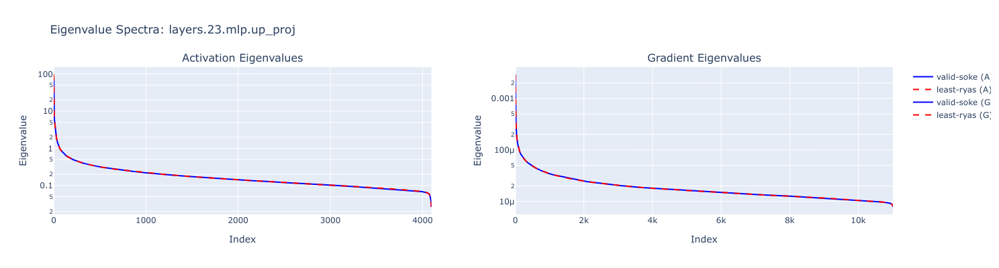

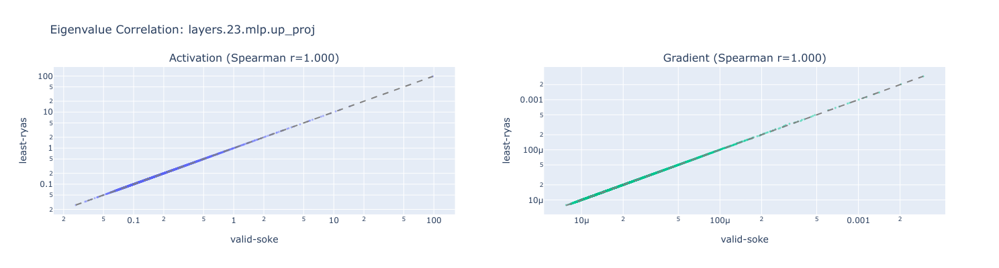

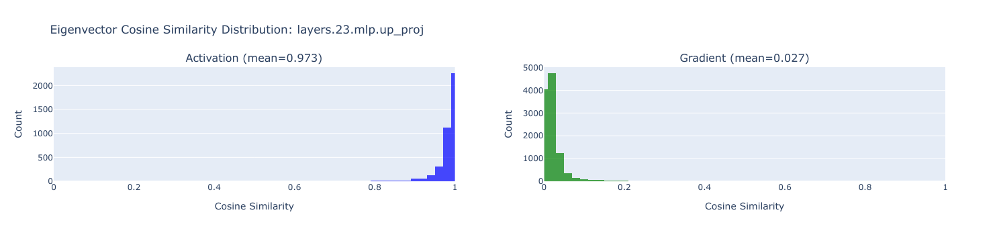

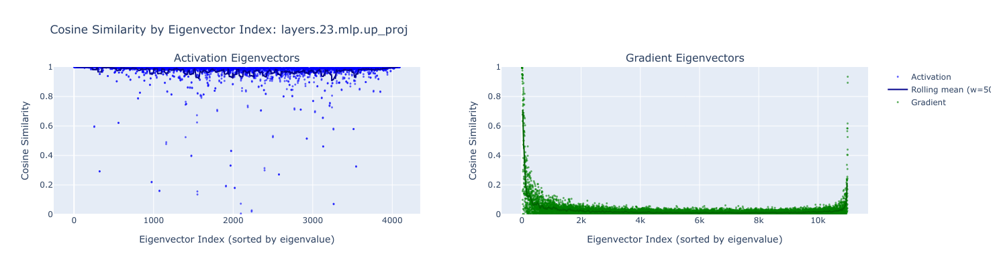

In [63]:
comparison = compare_dvc_experiments(
    exp1="valid-soke",
    exp2="least-ryas",
    module_name="layers.23.mlp.up_proj",
    kfac_output_path="out/collect_kfac/bergson/7b"
)

# Display all comparison plots
plot_all_comparisons(comparison)

In [64]:
def plot_eigenvector_heatmaps(comparison: dict, n_eigenvectors: int = 50, eigenvector_type: str = "A") -> go.Figure:
    """Plot heatmaps of eigenvector matrices side by side.
    
    Args:
        comparison: Result from compare_experiments or compare_dvc_experiments
        n_eigenvectors: Number of top eigenvectors to show
        eigenvector_type: "A" for activation, "G" for gradient
    """
    key = f'evc_{eigenvector_type}'
    evc1 = comparison['data1'][key][:, :n_eigenvectors].numpy()
    evc2 = comparison['data2'][key][:, :n_eigenvectors].numpy()
    
    type_name = "Activation" if eigenvector_type == "A" else "Gradient"
    
    fig = make_subplots(
        rows=1, cols=3,
        subplot_titles=[
            f"{comparison['label1']} ({type_name})",
            f"{comparison['label2']} ({type_name})",
            "Absolute Difference"
        ],
        horizontal_spacing=0.08
    )
    
    # Common color scale
    vmax = max(np.abs(evc1).max(), np.abs(evc2).max())
    
    fig.add_trace(
        go.Heatmap(z=evc1, colorscale='RdBu', zmin=-vmax, zmax=vmax, showscale=False),
        row=1, col=1
    )
    fig.add_trace(
        go.Heatmap(z=evc2, colorscale='RdBu', zmin=-vmax, zmax=vmax, showscale=False),
        row=1, col=2
    )
    
    diff = np.abs(evc1) - np.abs(evc2)  # Compare magnitudes (sign can flip)
    fig.add_trace(
        go.Heatmap(z=diff, colorscale='RdBu', zmin=-vmax, zmax=vmax, showscale=True),
        row=1, col=3
    )
    
    fig.update_layout(
        title=f"Eigenvector Matrices (top {n_eigenvectors}): {comparison['module']}",
        height=500,
    )
    fig.update_xaxes(title_text="Eigenvector Index", row=1, col=1)
    fig.update_xaxes(title_text="Eigenvector Index", row=1, col=2)
    fig.update_xaxes(title_text="Eigenvector Index", row=1, col=3)
    fig.update_yaxes(title_text="Dimension", row=1, col=1)
    
    return fig


def plot_top_eigenvectors(comparison: dict, n_top: int = 5, eigenvector_type: str = "A") -> go.Figure:
    """Plot individual top eigenvectors side by side.
    
    Args:
        comparison: Result from compare_experiments or compare_dvc_experiments
        n_top: Number of top eigenvectors to show
        eigenvector_type: "A" for activation, "G" for gradient
    """
    key = f'evc_{eigenvector_type}'
    cos_key = f'cos_sim_{eigenvector_type}'
    
    evc1 = comparison['data1'][key]
    evc2 = comparison['data2'][key]
    cos_sim = comparison[cos_key]
    
    type_name = "Activation" if eigenvector_type == "A" else "Gradient"
    
    fig = make_subplots(
        rows=n_top, cols=1,
        subplot_titles=[f"Eigenvector {i} (cos={cos_sim[i]:.3f})" for i in range(n_top)],
        vertical_spacing=0.08
    )
    
    for i in range(n_top):
        v1 = evc1[:, i].numpy()
        v2 = evc2[:, i].numpy()
        
        # Align signs (eigenvectors can have arbitrary sign)
        if np.dot(v1, v2) < 0:
            v2 = -v2
        
        fig.add_trace(
            go.Scatter(y=v1, mode='lines', name=f'{comparison["label1"]} #{i}',
                      line=dict(color='blue', width=1), showlegend=(i == 0)),
            row=i+1, col=1
        )
        fig.add_trace(
            go.Scatter(y=v2, mode='lines', name=f'{comparison["label2"]} #{i}',
                      line=dict(color='red', width=1, dash='dash'), showlegend=(i == 0)),
            row=i+1, col=1
        )
    
    fig.update_layout(
        title=f"Top {n_top} {type_name} Eigenvectors: {comparison['module']}",
        height=200 * n_top,
        showlegend=True
    )
    
    return fig


def plot_eigenvector_scatter_matrix(comparison: dict, indices: list = None, eigenvector_type: str = "A") -> go.Figure:
    """Scatter plot of eigenvector values between experiments.
    
    Args:
        comparison: Result from compare_experiments or compare_dvc_experiments
        indices: List of eigenvector indices to plot (default: [0, 1, 2, 3])
        eigenvector_type: "A" for activation, "G" for gradient
    """
    if indices is None:
        indices = [0, 1, 2, 3]
    
    key = f'evc_{eigenvector_type}'
    cos_key = f'cos_sim_{eigenvector_type}'
    
    evc1 = comparison['data1'][key]
    evc2 = comparison['data2'][key]
    cos_sim = comparison[cos_key]
    
    type_name = "Activation" if eigenvector_type == "A" else "Gradient"
    n = len(indices)
    
    fig = make_subplots(
        rows=1, cols=n,
        subplot_titles=[f"Eig {i} (cos={cos_sim[i]:.3f})" for i in indices],
    )
    
    for col, idx in enumerate(indices):
        v1 = evc1[:, idx].numpy()
        v2 = evc2[:, idx].numpy()
        
        # Align signs
        if np.dot(v1, v2) < 0:
            v2 = -v2
        
        fig.add_trace(
            go.Scatter(x=v1, y=v2, mode='markers',
                      marker=dict(size=2, opacity=0.5),
                      showlegend=False),
            row=1, col=col+1
        )
        
        # Add diagonal line
        vmin, vmax = min(v1.min(), v2.min()), max(v1.max(), v2.max())
        fig.add_trace(
            go.Scatter(x=[vmin, vmax], y=[vmin, vmax], mode='lines',
                      line=dict(color='gray', dash='dash'), showlegend=False),
            row=1, col=col+1
        )
        
        fig.update_xaxes(title_text=comparison['label1'], row=1, col=col+1)
        fig.update_yaxes(title_text=comparison['label2'], row=1, col=col+1)
    
    fig.update_layout(
        title=f"{type_name} Eigenvector Value Comparison: {comparison['module']}",
        height=350,
    )
    
    return fig


def plot_eigenvector_comparison(comparison: dict, eigenvector_type: str = "A"):
    """Display all eigenvector comparison plots for a given type."""
    type_name = "Activation" if eigenvector_type == "A" else "Gradient"
    print(f"\n=== {type_name} Eigenvector Comparison ===\n")
    
    display(plot_eigenvector_heatmaps(comparison, n_eigenvectors=50, eigenvector_type=eigenvector_type))
    display(plot_eigenvector_scatter_matrix(comparison, indices=[0, 1, 2, 3], eigenvector_type=eigenvector_type))
    display(plot_top_eigenvectors(comparison, n_top=5, eigenvector_type=eigenvector_type))


print("Eigenvector visualization functions loaded.")

Eigenvector visualization functions loaded.



=== Activation Eigenvector Comparison ===



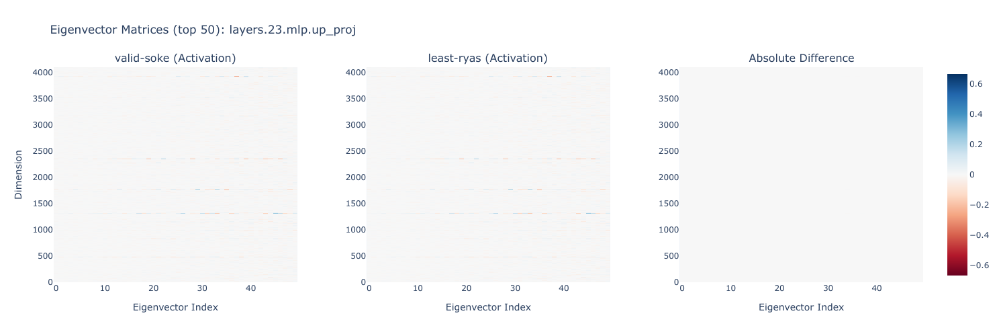

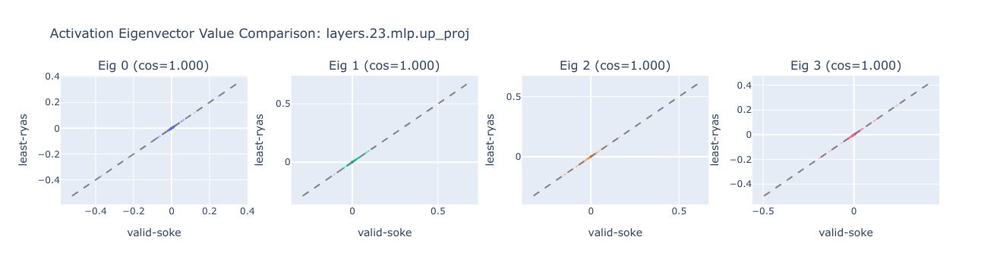

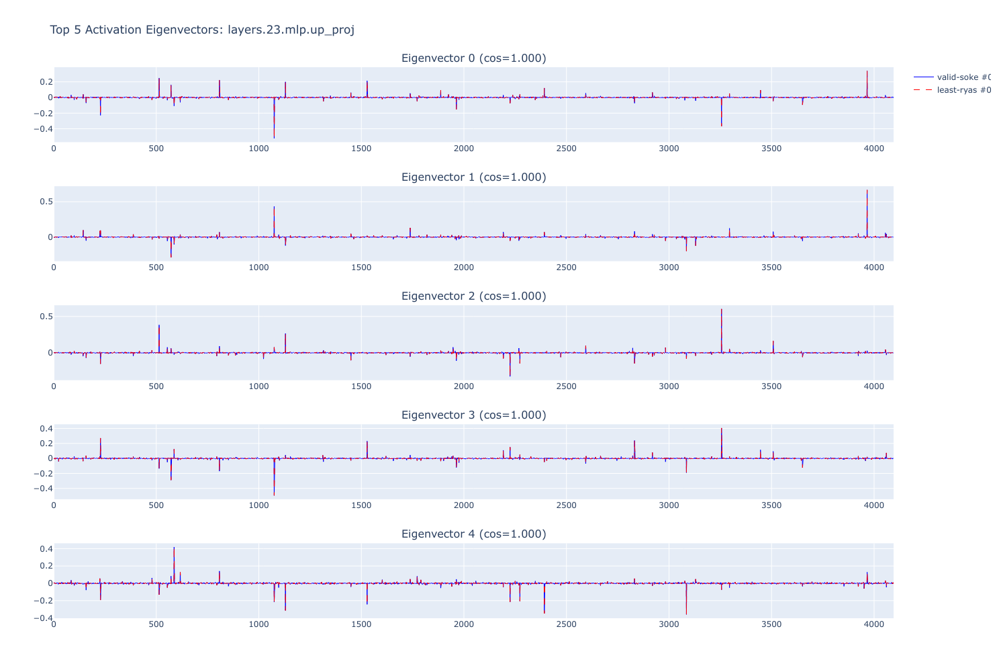


=== Gradient Eigenvector Comparison ===



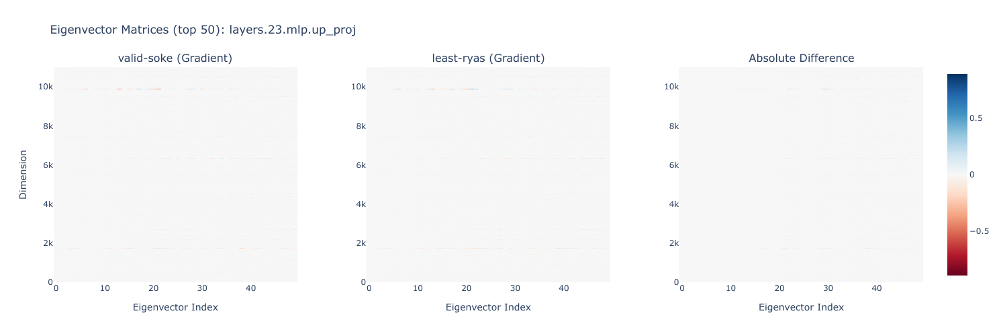

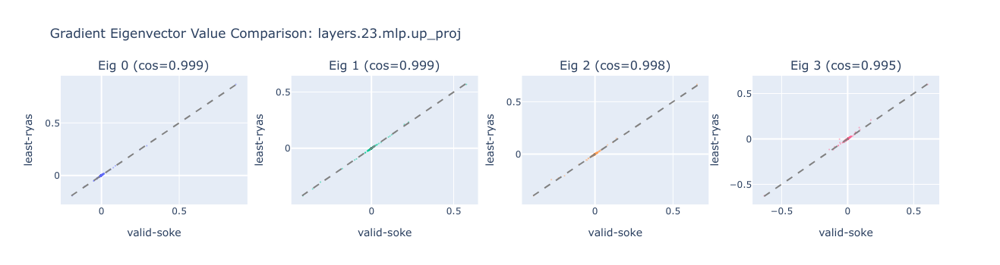

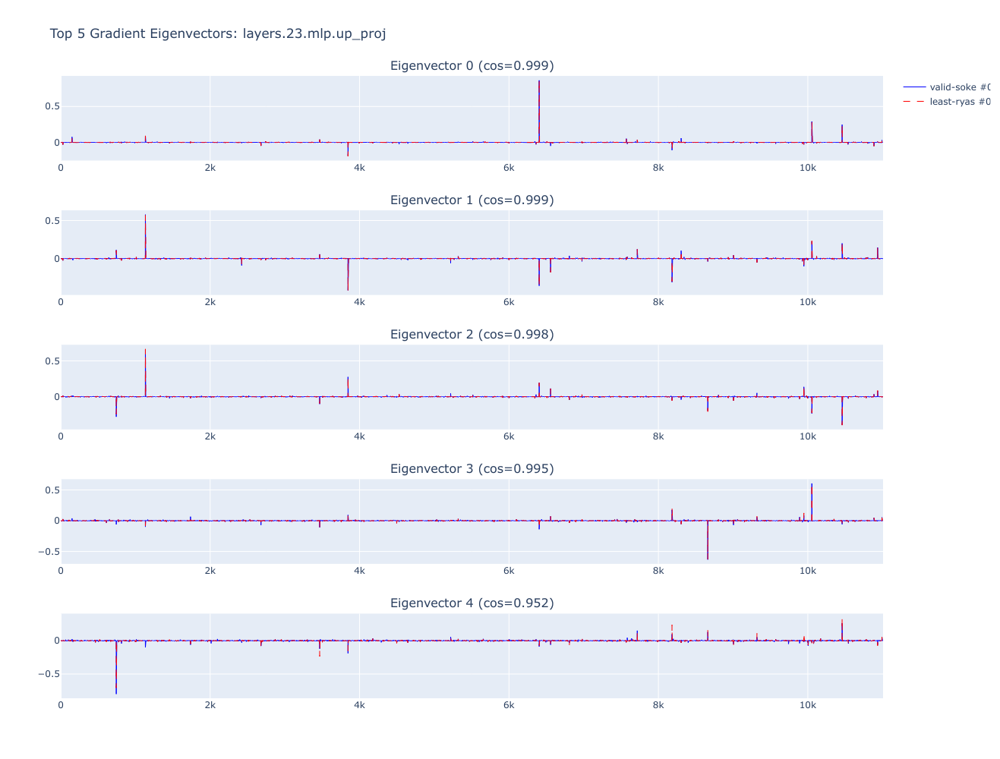

In [65]:
# Visual comparison of eigenvectors from both experiments
# Run after loading comparison data

plot_eigenvector_comparison(comparison, eigenvector_type="A")
plot_eigenvector_comparison(comparison, eigenvector_type="G")

In [57]:
# Interactive comparison UI
def create_comparison_ui():
    """Create an interactive UI for comparing experiments."""
    
    # Text inputs for experiment paths
    path1_input = widgets.Text(
        value='out/collect_kfac/bergson/7b',
        description='Path 1:',
        style={'description_width': '60px'},
        layout=widgets.Layout(width='400px')
    )
    path2_input = widgets.Text(
        value='out/collect_kfac/bergson/7b',
        description='Path 2:',
        style={'description_width': '60px'},
        layout=widgets.Layout(width='400px')
    )
    label1_input = widgets.Text(
        value='Experiment 1',
        description='Label 1:',
        style={'description_width': '60px'},
        layout=widgets.Layout(width='200px')
    )
    label2_input = widgets.Text(
        value='Experiment 2',
        description='Label 2:',
        style={'description_width': '60px'},
        layout=widgets.Layout(width='200px')
    )
    
    # Module dropdown (populated when paths change)
    module_dropdown = widgets.Dropdown(
        options=[],
        description='Module:',
        style={'description_width': '60px'},
        layout=widgets.Layout(width='350px')
    )
    
    load_modules_btn = widgets.Button(description='Load Modules', button_style='info')
    compare_btn = widgets.Button(description='Compare', button_style='success')
    output = widgets.Output()
    
    def load_modules(btn):
        output.clear_output()
        with output:
            try:
                modules = list_available_modules(path1_input.value)
                module_dropdown.options = modules
                if modules:
                    # Default to a common layer
                    default = next((m for m in modules if 'layers.23.mlp' in m), modules[0])
                    module_dropdown.value = default
                print(f"Loaded {len(modules)} modules from {path1_input.value}")
            except Exception as e:
                print(f"Error loading modules: {e}")
    
    def run_comparison(btn):
        output.clear_output()
        with output:
            try:
                comparison = compare_experiments(
                    path1=path1_input.value,
                    path2=path2_input.value,
                    module_name=module_dropdown.value,
                    label1=label1_input.value,
                    label2=label2_input.value
                )
                plot_all_comparisons(comparison)
            except Exception as e:
                import traceback
                print(f"Error: {e}")
                traceback.print_exc()
    
    load_modules_btn.on_click(load_modules)
    compare_btn.on_click(run_comparison)
    
    ui = widgets.VBox([
        widgets.HBox([path1_input, label1_input]),
        widgets.HBox([path2_input, label2_input]),
        widgets.HBox([module_dropdown, load_modules_btn, compare_btn]),
        output
    ])
    
    return ui

# Display the comparison UI
comparison_ui = create_comparison_ui()
display(comparison_ui)

In [58]:
def compare_all_modules(
    path1: str, 
    path2: str,
    label1: str = "Exp 1",
    label2: str = "Exp 2",
    module_filter: str = None
) -> pd.DataFrame:
    """Compare eigenvectors across all modules and return summary DataFrame.
    
    Args:
        path1, path2: Paths to experiment directories
        label1, label2: Labels for the experiments
        module_filter: Optional substring to filter modules (e.g., 'mlp.up_proj')
        
    Returns:
        DataFrame with comparison metrics for each module
    """
    modules = list_available_modules(path1)
    if module_filter:
        modules = [m for m in modules if module_filter in m]
    
    results = []
    for module in modules:
        try:
            comparison = compare_experiments(path1, path2, module, label1, label2)
            results.append({
                'module': module,
                'cos_sim_A_mean': comparison['cos_sim_A'].mean().item(),
                'cos_sim_A_std': comparison['cos_sim_A'].std().item(),
                'cos_sim_G_mean': comparison['cos_sim_G'].mean().item(),
                'cos_sim_G_std': comparison['cos_sim_G'].std().item(),
                'eva_spearman_A': comparison['eva_corr_A']['spearman_r'],
                'eva_spearman_G': comparison['eva_corr_G']['spearman_r'],
            })
        except Exception as e:
            print(f"Error comparing {module}: {e}")
    
    return pd.DataFrame(results)


def plot_module_comparison_summary(summary_df: pd.DataFrame) -> go.Figure:
    """Plot summary of cosine similarities across modules."""
    fig = make_subplots(
        rows=2, cols=1,
        subplot_titles=["Activation Eigenvector Similarity", "Gradient Eigenvector Similarity"],
        vertical_spacing=0.15
    )
    
    # Sort by layer number if possible
    def extract_layer(m):
        import re
        match = re.search(r'layers\.(\d+)', m)
        return int(match.group(1)) if match else 0
    
    summary_df = summary_df.copy()
    summary_df['layer_num'] = summary_df['module'].apply(extract_layer)
    summary_df = summary_df.sort_values('layer_num')
    
    # Activation
    fig.add_trace(
        go.Bar(
            x=summary_df['module'],
            y=summary_df['cos_sim_A_mean'],
            error_y=dict(type='data', array=summary_df['cos_sim_A_std']),
            name='Activation',
            marker_color='blue'
        ),
        row=1, col=1
    )
    
    # Gradient
    fig.add_trace(
        go.Bar(
            x=summary_df['module'],
            y=summary_df['cos_sim_G_mean'],
            error_y=dict(type='data', array=summary_df['cos_sim_G_std']),
            name='Gradient',
            marker_color='green'
        ),
        row=2, col=1
    )
    
    fig.update_layout(
        height=600,
        showlegend=False,
        title="Eigenvector Similarity Across Modules"
    )
    fig.update_yaxes(title_text="Mean Cosine Similarity", range=[0, 1], row=1, col=1)
    fig.update_yaxes(title_text="Mean Cosine Similarity", range=[0, 1], row=2, col=1)
    fig.update_xaxes(tickangle=45, row=1, col=1)
    fig.update_xaxes(tickangle=45, row=2, col=1)
    
    return fig


print("Multi-module comparison functions loaded.")

Multi-module comparison functions loaded.


### Example: Compare all modules

```python
# Compare all up_proj modules between two experiments
summary = compare_all_modules(
    "out/collect_kfac/bergson/7b",
    "out/collect_kfac/original/7b",
    label1="Bergson",
    label2="Original",
    module_filter="mlp.up_proj"
)

# Display summary table
display(summary)

# Plot summary
plot_module_comparison_summary(summary)
```